<a href="https://colab.research.google.com/github/Ea-mjolnir/Microwave-Remote-sensing/blob/main/ML_for_predictive_Analytics_In_Remote_Sensing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project: Monitoring Deforestation and Land Use Change with Satellite Imagery and Machine Learning

In [16]:
!pip install rasterio geopandas matplotlib scikit-learn earthengine-api --quiet
!pip install geemap --quiet
!pip install folium --quiet
!pip install earthengine-api folium --quiet


In [17]:
import ee
import geemap

# Authenticate with your Google Earth Engine account.
ee.Authenticate()

# Initialize Earth Engine with your project ID.
# Replace 'your-project-id' with your actual project ID.
ee.Initialize(project='gee-project-456012')


In [18]:
import folium
import ee
from folium import plugins

# Define a rectangle AOI: [xmin, ymin, xmax, ymax]
aoi = ee.Geometry.Rectangle([38.0, -0.5, 38.5, 0.0])

# Create a folium Map
Map = folium.Map(location=[-0.25, 38.25], zoom_start=10)
folium.GeoJson(data=aoi.getInfo(), name='AOI').add_to(Map)

# Display the map with the AOI
Map

# Date ranges for 2020 and 2024
start_year_1 = '2020-01-01'
end_year_1 = '2020-12-31'

start_year_2 = '2024-01-01'
end_year_2 = '2024-12-31'


# Function to mask clouds and cirrus in Sentinel-2 data
def mask_s2_sr(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10  # Bit 10: clouds
    cirrus_bit_mask = 1 << 11  # Bit 11: cirrus
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)  # Normalize reflectance


# Function to get a composite image over a time range
def get_composite(start_date, end_date, aoi):
    collection = (
        ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterDate(start_date, end_date)
        .filterBounds(aoi)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
        .map(mask_s2_sr)
    )
    return collection.median().clip(aoi)


# Function to calculate NDVI and NDWI indices
def calculate_indices(image):
    # Calculate NDVI
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')

    # Calculate NDWI
    ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')

    return image.addBands([ndvi, ndwi])


# Function to add Earth Engine layer to folium map
def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles=map_id_dict['tile_fetcher'].url_format,
        attr='Google Earth Engine',
        name=name,
        overlay=True,
        control=True
    ).add_to(self)

# Add the `add_ee_layer` method to the folium Map object
folium.Map.add_ee_layer = add_ee_layer


# Get composite images for 2020 and 2024
image_2020 = get_composite(start_year_1, end_year_1, aoi)
image_2024 = get_composite(start_year_2, end_year_2, aoi)

# Calculate indices for both years
image_2020_indices = calculate_indices(image_2020)
image_2024_indices = calculate_indices(image_2024)

# Calculate the difference in NDVI between 2024 and 2020
ndvi_diff = image_2024_indices.select('NDVI').subtract(image_2020_indices.select('NDVI')).rename('NDVI_Diff')

# Calculate the difference in NDWI between 2024 and 2020
ndwi_diff = image_2024_indices.select('NDWI').subtract(image_2020_indices.select('NDWI')).rename('NDWI_Diff')

# Add the difference bands to the 2024 image
image_2024_with_diff = image_2024_indices.addBands([ndvi_diff, ndwi_diff])


# Visualization parameters for the difference
vis_params = {
    'min': -0.5,
    'max': 0.5,
    'palette': ['blue', 'white', 'green']
}

# Add the NDVI difference layer to the map
Map.add_ee_layer(ndvi_diff, vis_params, 'NDVI Difference (2024 - 2020)')

# Add Layer Control to switch between layers
Map.add_child(folium.LayerControl())

# Display the map
Map


In [19]:
import folium
import ee
from folium import plugins

# Define a rectangle AOI: [xmin, ymin, xmax, ymax]
aoi = ee.Geometry.Rectangle([38.0, -0.5, 38.5, 0.0])

# Create a folium Map
Map = folium.Map(location=[-0.25, 38.25], zoom_start=10)
folium.GeoJson(data=aoi.getInfo(), name='AOI').add_to(Map)

# Display the map with the AOI
Map

# Date ranges for 2020 and 2024
start_year_1 = '2020-01-01'
end_year_1 = '2020-12-31'

start_year_2 = '2024-01-01'
end_year_2 = '2024-12-31'


# Function to mask clouds and cirrus in Sentinel-2 data
def mask_s2_sr(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10  # Bit 10: clouds
    cirrus_bit_mask = 1 << 11  # Bit 11: cirrus
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)  # Normalize reflectance


# Function to get a composite image over a time range
def get_composite(start_date, end_date, aoi):
    collection = (
        ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterDate(start_date, end_date)
        .filterBounds(aoi)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
        .map(mask_s2_sr)
    )
    return collection.median().clip(aoi)


# Function to calculate NDVI and NDWI indices
def calculate_indices(image):
    # Calculate NDVI
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')

    # Calculate NDWI
    ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')

    return image.addBands([ndvi, ndwi])


# Function to add Earth Engine layer to folium map
def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles=map_id_dict['tile_fetcher'].url_format,
        attr='Google Earth Engine',
        name=name,
        overlay=True,
        control=True
    ).add_to(self)

# Add the `add_ee_layer` method to the folium Map object
folium.Map.add_ee_layer = add_ee_layer


# Get composite images for 2020 and 2024
image_2020 = get_composite(start_year_1, end_year_1, aoi)
image_2024 = get_composite(start_year_2, end_year_2, aoi)

# Calculate indices for both years
image_2020_indices = calculate_indices(image_2020)
image_2024_indices = calculate_indices(image_2024)

# Calculate the difference in NDVI between 2024 and 2020
ndvi_diff = image_2024_indices.select('NDVI').subtract(image_2020_indices.select('NDVI')).rename('NDVI_Diff')

# Define thresholds for identifying change in NDVI
increase_threshold = 0.2  # Increase in NDVI is significant if > 0.2
decrease_threshold = -0.2  # Decrease in NDVI is significant if < -0.2

# Create a mask for areas of increase, decrease, and no change
increase_mask = ndvi_diff.gt(increase_threshold)
decrease_mask = ndvi_diff.lt(decrease_threshold)
no_change_mask = ndvi_diff.abs().lt(0.1)  # No change if the difference is small

# Assign labels: 1 for increase, 2 for decrease, 0 for no change
change_map = increase_mask.multiply(1).add(decrease_mask.multiply(2)).add(no_change_mask.multiply(0))

# Visualization parameters for the change map
change_vis_params = {
    'min': 0,
    'max': 2,
    'palette': ['green', 'red', 'gray']  # Green for increase, red for decrease, gray for no change
}

# Add the change map to the folium map
Map.add_ee_layer(change_map, change_vis_params, 'NDVI Change')

# Add Layer Control to switch between layers
Map.add_child(folium.LayerControl())

# Display the map
Map


In [20]:
import folium
import numpy as np
import pandas as pd
from folium import plugins
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
from sklearn.metrics import classification_report, confusion_matrix
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.metrics import accuracy_score
from datetime import datetime, timedelta


# Define a rectangle AOI: [xmin, ymin, xmax, ymax]
aoi = ee.Geometry.Rectangle([38.0, -0.5, 38.5, 0.0])

# Create a folium map
Map = folium.Map(location=[-0.25, 38.25], zoom_start=10)
folium.GeoJson(data=aoi.getInfo(), name='AOI').add_to(Map)

# Define date ranges
start_year_1 = '2020-01-01'
end_year_1 = '2020-12-31'
start_year_2 = '2024-01-01'
end_year_2 = '2024-12-31'

# Function to calculate NDVI, EVI, and SAVI
def calculate_evi(image):
    evi = image.expression(
        '2.5 * (B8 - B4) / (B8 + 6 * B4 - 7.5 * B3 + 10000)',
        {'B8': image.select('B8'), 'B4': image.select('B4'), 'B3': image.select('B3')}
    ).rename('EVI')
    return evi

def calculate_savi(image):
    savi = image.expression(
        '(B8 - B4) / (B8 + B4 + 0.5) * (1 + 0.5)',
        {'B8': image.select('B8'), 'B4': image.select('B4')}
    ).rename('SAVI')
    return savi

def calculate_indices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    evi = calculate_evi(image)
    savi = calculate_savi(image)
    return image.addBands([ndvi, evi, savi])

# Get Sentinel-2 composites for the two periods (2020 and 2024)
def get_composite(start_date, end_date, aoi):
    collection = (
        ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterDate(start_date, end_date)
        .filterBounds(aoi)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
        .map(calculate_indices)
    )
    return collection.median().clip(aoi)

image_2020 = get_composite(start_year_1, end_year_1, aoi)
image_2024 = get_composite(start_year_2, end_year_2, aoi)

# Function to classify vegetation (using NDVI as an example)
def classify_vegetation(image):
    healthy_mask = image.select('NDVI').gt(0.4)
    stressed_mask = image.select('NDVI').lt(0.2)
    no_change_mask = image.select('NDVI').gt(0.2).And(image.select('NDVI').lt(0.4))

    healthy = healthy_mask.multiply(0)
    stressed = stressed_mask.multiply(1)
    no_change = no_change_mask.multiply(2)

    # Add `.rename('classification')` here!
    return healthy.add(stressed).add(no_change).rename('classification')


# Classify both 2020 and 2024 images
classified_2020 = classify_vegetation(image_2020)
classified_2024 = classify_vegetation(image_2024)

# Combine indices and classification bands into one image
image_2020_labeled = image_2020.addBands(classify_vegetation(image_2020))
image_2024_labeled = image_2024.addBands(classify_vegetation(image_2024))

# Sample training points from labeled images
train_points_2020 = image_2020_labeled.sample(region=aoi, scale=10, numPixels=500, seed=42)
train_points_2024 = image_2024_labeled.sample(region=aoi, scale=10, numPixels=500, seed=42)

# Merge both years into one set
training_points = train_points_2020.merge(train_points_2024)

# (Optional, just aliasing for clarity)
training_data = training_points


# Convert the training data into a pandas DataFrame.
df = training_data.getInfo()

# Safely extract the 'properties' dict from each feature
data = pd.json_normalize(df['features'])  # flattens nested JSON into columns


# Access the columns using their correct names within the 'properties' dictionary
data = data[['properties.NDVI', 'properties.EVI', 'properties.SAVI', 'properties.classification']]  # Accessing columns within 'properties'

# Rename columns for easier access
data = data.rename(columns={
    'properties.NDVI': 'NDVI',
    'properties.EVI': 'EVI',
    'properties.SAVI': 'SAVI',
    'properties.classification': 'label'
})


# Drop rows with missing values
data = data.dropna(subset=['NDVI', 'EVI', 'SAVI', 'label'])


# Extract features and labels
X = data[['NDVI', 'EVI', 'SAVI']].values.astype(np.float32)
y = data['label'].values.astype(np.int64)


# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.long)


# 1. First, split into train+val and test
X_temp, X_test, y_temp, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)

# 2. Then split train+val into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2


#print headers
print(data.head())

print(f"Train set size: {X_train.shape[0]}")
print(f"Validation set size: {X_val.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")


print(f"Train labels distribution: {np.unique(y_train, return_counts=True)}")
print(f"Validation labels distribution: {np.unique(y_val, return_counts=True)}")


       NDVI       EVI      SAVI  label
0  0.447594  0.291883  0.671281      0
1  0.309914  0.196125  0.464796      2
2  0.222838  0.160100  0.334220      2
3  0.165564  0.159637  0.248317      1
4  0.268128  0.186403  0.402135      2
Train set size: 300
Validation set size: 100
Test set size: 100
Train labels distribution: (array([0, 1, 2]), array([ 66,  56, 178]))
Validation labels distribution: (array([0, 1, 2]), array([25, 10, 65]))


Epoch [10/300] | Train Loss: 0.6084, Train Acc: 81.00% | Val Loss: 1.0510, Val Acc: 53.00%
Epoch [20/300] | Train Loss: 0.4126, Train Acc: 89.00% | Val Loss: 0.7474, Val Acc: 70.00%
Epoch [30/300] | Train Loss: 0.3408, Train Acc: 91.33% | Val Loss: 0.6087, Val Acc: 72.00%
Epoch [40/300] | Train Loss: 0.3008, Train Acc: 91.67% | Val Loss: 0.4987, Val Acc: 76.00%
Epoch [50/300] | Train Loss: 0.2511, Train Acc: 94.00% | Val Loss: 0.3637, Val Acc: 84.00%
Epoch [60/300] | Train Loss: 0.2225, Train Acc: 94.00% | Val Loss: 0.2675, Val Acc: 92.00%
Epoch [70/300] | Train Loss: 0.1875, Train Acc: 95.33% | Val Loss: 0.2301, Val Acc: 93.00%
Epoch [80/300] | Train Loss: 0.1806, Train Acc: 93.67% | Val Loss: 0.2269, Val Acc: 93.00%
Epoch [90/300] | Train Loss: 0.1804, Train Acc: 94.33% | Val Loss: 0.2192, Val Acc: 92.00%
Epoch [100/300] | Train Loss: 0.1468, Train Acc: 96.00% | Val Loss: 0.2113, Val Acc: 92.00%
Epoch [110/300] | Train Loss: 0.1440, Train Acc: 95.00% | Val Loss: 0.2119, Val Acc: 91.0

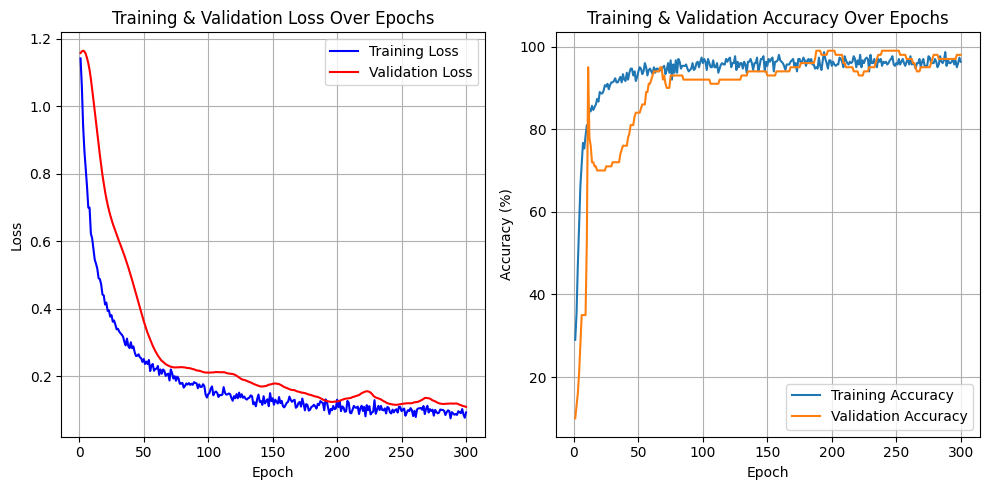

In [21]:
# Model Definition
class ImprovedMLPModel(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(ImprovedMLPModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.bn1 = nn.BatchNorm1d(128)
        self.drop1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(128, 64)
        self.bn2 = nn.BatchNorm1d(64)
        self.drop2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(64, output_dim)

    def forward(self, x):
        x = self.drop1(torch.relu(self.bn1(self.fc1(x))))
        x = self.drop2(torch.relu(self.bn2(self.fc2(x))))
        return self.fc3(x)

model = ImprovedMLPModel(input_dim=3, output_dim=3)
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop with validation
epochs = 300
train_accuracies, val_accuracies = [], []
train_losses, val_losses = [], []

for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    outputs = model(X_train)
    loss = loss_fn(outputs, y_train)
    loss.backward()
    optimizer.step()

    train_losses.append(loss.item())
    _, train_preds = torch.max(outputs, 1)
    train_acc = accuracy_score(y_train.numpy(), train_preds.numpy())
    train_accuracies.append(train_acc)

    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val)
        val_loss = loss_fn(val_outputs, y_val)
        _, val_preds = torch.max(val_outputs, 1)
        val_acc = accuracy_score(y_val.numpy(), val_preds.numpy())

    val_losses.append(val_loss.item())
    val_accuracies.append(val_acc)

    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{epochs}] | "
              f"Train Loss: {loss.item():.4f}, Train Acc: {train_acc*100:.2f}% | "
              f"Val Loss: {val_loss.item():.4f}, Val Acc: {val_acc*100:.2f}%")



# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(10,5))  # 2 rows, 1 column


# Plot training and validation loss in the second subplot
axes[0].plot(range(1, epochs + 1), train_losses, label='Training Loss', color='blue')
axes[0].plot(range(1, epochs + 1), val_losses, label='Validation Loss', color='red')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training & Validation Loss Over Epochs')
axes[0].legend()
axes[0].grid(True)

# Plot training and validation accuracy in the first subplot
axes[1].plot(range(1, epochs + 1), [a * 100 for a in train_accuracies], label='Training Accuracy')
axes[1].plot(range(1, epochs + 1), [a * 100 for a in val_accuracies], label='Validation Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Training & Validation Accuracy Over Epochs')
axes[1].legend()
axes[1].grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()
# Show the plots
plt.show()



 Accuracy on test set: 98.00%

 Classification Report:
              precision    recall  f1-score   support

     Healthy       1.00      0.96      0.98        23
    Stressed       0.93      1.00      0.96        13
   No Change       0.98      0.98      0.98        64

    accuracy                           0.98       100
   macro avg       0.97      0.98      0.98       100
weighted avg       0.98      0.98      0.98       100



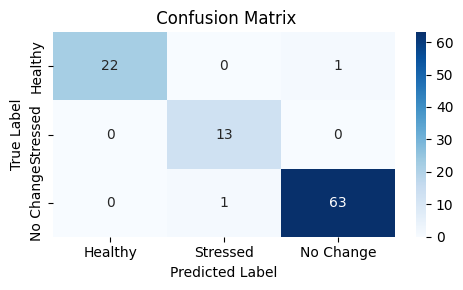

In [22]:

# Test the model
model.eval()
with torch.no_grad():
    y_pred = model(X_test)
    _, predicted = torch.max(y_pred, 1)

    # Accuracy
    accuracy = accuracy_score(y_test, predicted)
    print(f"\n Accuracy on test set: {accuracy * 100:.2f}%")

    # Classification Report
    print("\n Classification Report:")
    print(classification_report(y_test.numpy(), predicted.numpy(), target_names=["Healthy", "Stressed", "No Change"]))

    # Confusion Matrix
    cm = confusion_matrix(y_test.numpy(), predicted.numpy())
    plt.figure(figsize=(5,3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=["Healthy", "Stressed", "No Change"],
                yticklabels=["Healthy", "Stressed", "No Change"])
    plt.title(" Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()


In [63]:
# Function to calculate EVI
def calculate_evi(image):
    evi = image.expression(
        '2.5 * (B8 - B4) / (B8 + 6 * B4 - 7.5 * B3 + 10000)',
        {'B8': image.select('B8'), 'B4': image.select('B4'), 'B3': image.select('B3')}
    ).rename('EVI')
    return evi

# Function to calculate SAVI
def calculate_savi(image):
    savi = image.expression(
        '(B8 - B4) / (B8 + B4 + 0.5) * (1 + 0.5)',
        {'B8': image.select('B8'), 'B4': image.select('B4')}
    ).rename('SAVI')
    return savi

# Function to calculate NDVI, EVI, and SAVI
def calculate_indices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    evi = calculate_evi(image)
    savi = calculate_savi(image)
    return image.addBands([ndvi, evi, savi])

# Function to get Sentinel-2 composite image for the specified date range
def get_composite(start_date, end_date, aoi):
    collection = (
        ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterDate(start_date, end_date)
        .filterBounds(aoi)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
        .map(calculate_indices)
    )
    return collection.median().clip(aoi)

# Function to classify vegetation based on NDVI values
def classify_vegetation(image):
    healthy_mask = image.select('NDVI').gt(0.4)
    stressed_mask = image.select('NDVI').lt(0.2)
    no_change_mask = image.select('NDVI').gt(0.2).And(image.select('NDVI').lt(0.4))

    healthy = healthy_mask.multiply(0)
    stressed = stressed_mask.multiply(1)
    no_change = no_change_mask.multiply(2)

    return healthy.add(stressed).add(no_change).rename('classification')

# Function to generate date ranges dynamically (for multiple years)
def get_date_range(start_date, end_date):
    # Parse input dates
    start = datetime.strptime(start_date, "%Y-%m-%d")
    end = datetime.strptime(end_date, "%Y-%m-%d")

    # Generate date ranges in yearly steps
    date_ranges = []
    current_start = start
    while current_start < end:
        current_end = current_start.replace(year=current_start.year + 1) - timedelta(days=1)
        if current_end > end:
            current_end = end
        date_ranges.append((current_start.strftime('%Y-%m-%d'), current_end.strftime('%Y-%m-%d')))
        current_start = current_end + timedelta(days=1)

    return date_ranges


# Main function to process the AOI and get tensors for prediction
def process_aoi_for_prediction(aoi, start_date, end_date, num_pixels_per_year=5000):
    date_ranges = get_date_range(start_date, end_date)

    all_features = []

    for start, end in date_ranges:
        print(f"Processing: {start} to {end}")
        image = get_composite(start, end, aoi)
        classified_image = classify_vegetation(image)
        image_labeled = image.addBands(classified_image)

        try:
            # Sample points from GEE image (smaller batch)
            train_points = image_labeled.sample(region=aoi, scale=10, numPixels=num_pixels_per_year, seed=42 , geometries=True )
            features = train_points.getInfo()['features']
            all_features.extend(features)

        except Exception as e:
            print(f" Failed to process {start} to {end}: {e}")

    if not all_features:
        raise RuntimeError("No data could be fetched. Please check your AOI or date range.")

    # Convert to DataFrame
    data = pd.json_normalize(all_features)
    data = data[['properties.NDVI', 'properties.EVI', 'properties.SAVI', 'properties.classification']]
    data = data.rename(columns={
        'properties.NDVI': 'NDVI',
        'properties.EVI': 'EVI',
        'properties.SAVI': 'SAVI',
        'properties.classification': 'label'
    })

    # Drop any rows with NaNs
    data = data.dropna()

    # Features & labels
    X = data[['NDVI', 'EVI', 'SAVI']].values.astype(np.float32)
    y = data['label'].values.astype(np.int64)

    # Normalize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Tensors
    X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
    y_tensor = torch.tensor(y, dtype=torch.long)

    return X_tensor, y_tensor, scaler ,all_features


# Define the Area of Interest (AOI) using coordinates [xmin, ymin, xmax, ymax]
aoi = ee.Geometry.Rectangle([73.1, 30.6, 73.2, 30.7])

# Define the start date and end date (can be multi-year range)
start_date = '2022-01-01'  # Start date (could be '2020-01-01')
end_date = '2024-12-31'    # End date (could be '2022-12-31' or any desired date range)

# Call the function to get the tensors
X_tensor, y_tensor, scaler , all_features = process_aoi_for_prediction(aoi, start_date, end_date)



# Predict with confidence scores.....
model.eval()
with torch.no_grad():
    output = model(X_tensor)  # Raw logits
    probabilities = torch.nn.functional.softmax(output, dim=1)  # Convert logits to probabilities
    scores, predicted_labels = torch.max(probabilities, dim=1)  # Get max prob as confidence score

for i in range(10):  # Just show first 10 predictions
    confidence_percent = scores[i].item() * 100
    print(f"Sample {i+1}: Predicted Class = {predicted_labels[i].item()}, Confidence = {confidence_percent:.2f}%")



# Convert to DataFrame
# Step 1: Extract the 'properties' dict from each feature
properties_list = [f['properties'] for f in all_features]
# Step 2: Create a DataFrame
features_df = pd.DataFrame(properties_list)
# Step 3: Show first few rows
print(features_df.head())

Processing: 2022-01-01 to 2022-12-31
Processing: 2023-01-01 to 2023-12-31
Processing: 2024-01-01 to 2024-12-31
Sample 1: Predicted Class = 1, Confidence = 100.00%
Sample 2: Predicted Class = 1, Confidence = 100.00%
Sample 3: Predicted Class = 0, Confidence = 100.00%
Sample 4: Predicted Class = 0, Confidence = 100.00%
Sample 5: Predicted Class = 0, Confidence = 99.92%
Sample 6: Predicted Class = 1, Confidence = 99.98%
Sample 7: Predicted Class = 0, Confidence = 100.00%
Sample 8: Predicted Class = 0, Confidence = 100.00%
Sample 9: Predicted Class = 0, Confidence = 100.00%
Sample 10: Predicted Class = 0, Confidence = 100.00%
     AOT           B1          B11     B12      B2      B3      B4      B5  \
0  374.0  1090.500000  3540.000000  3583.0  1759.0  2313.0  2671.0  3032.0   
1  380.0   540.000000  2242.333333  1801.0   635.0  1058.0  1259.0  1615.0   
2  374.0   427.500000  2174.000000  1506.0   595.0   910.5   904.0  1304.5   
3  380.0   440.000000  2375.000000  1723.5   554.5   901.0

In [60]:
import folium
from folium.plugins import MarkerCluster
import numpy as np
import pandas as pd



# === Step 1: Extract 'properties' and 'geometry' from features === #
properties_list = []
for f, label, score in zip(all_features, predicted_labels, scores):
    props = f['properties'].copy()

    # Safe extraction of coordinates
    try:
        coords = f.get('geometry', {}).get('coordinates', [None, None])
        if coords is not None and len(coords) == 2:
            lon, lat = coords
        else:
            lon, lat = None, None
    except:
        lon, lat = None, None

    props['longitude'] = lon
    props['latitude'] = lat
    props['Predicted_Label'] = int(label)
    props['Confidence (%)'] = float(score) * 100
    properties_list.append(props)

# === Step 2: Create a DataFrame === #
df = pd.DataFrame(properties_list)

# Map labels to readable class names
label_map = {0: "Healthy", 1: "Stressed", 2: "No Change"}
df['Class_Name'] = df['Predicted_Label'].map(label_map)

# Drop rows without coordinates
df = df.dropna(subset=['latitude', 'longitude'])

# Debug info: check if DataFrame has content
if df.empty:
    print("❌ DataFrame is empty. Check if 'all_features' had valid data.")
else:
    print(f"✅ Loaded {len(df)} classified points.")
    print("Lat range:", df['latitude'].min(), "to", df['latitude'].max())
    print("Lon range:", df['longitude'].min(), "to", df['longitude'].max())


# === Step 3: Create a folium map rendering function === #
def render_prediction_map(df):
    if df.empty:
        print("No data to display on the map.")
        return None

    mean_lat = df['latitude'].mean()
    mean_lon = df['longitude'].mean()

    prediction_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=10)
    marker_cluster = MarkerCluster().add_to(prediction_map)

    color_map = {
        "Healthy": "green",
        "Stressed": "red",
        "No Change": "orange"
    }

    for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=4,
            color=color_map.get(row['Class_Name'], 'blue'),
            fill=True,
            fill_opacity=0.8,
            popup=f"Class: {row['Class_Name']}<br>Confidence: {row['Confidence (%)']:.2f}%"
        ).add_to(marker_cluster)

    return prediction_map


# === Step 4: Display the map === #
prediction_map = render_prediction_map(df)
prediction_map  # This will render inline in a notebook


✅ Loaded 8000 classified points.
Lat range: 30.60002165016709 to 30.699978329443056
Lon range: 73.10002446464404 to 73.1999612624489
